In [18]:
%matplotlib inline
import shutil, os, sys, glob
import numpy as np
from matplotlib import pyplot as plt
import ipyvolume as ipv
import mrcfile
#
sys.path.append('/home/fpoitevi/notebooks/cryo_home/slaclab/cryoEM-notebooks/src/')
import cryoemio
import imutils
import dataviz
import mrcutils
import componentutils as cmp
import clusterutils as cluster

## Load the latent space

Here we approximate it with PCA of multibody refinement

In [2]:
PROJECT_DIR  = '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/'
DATA_DIR     = PROJECT_DIR+'MultiBody/bin4_ofbin6postautopickgoodgood/'
ANALYSIS_DIR = PROJECT_DIR+'MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/'

In [3]:
projection_file  = ANALYSIS_DIR+'init_gmm_dim18_n2_cluster_0_projs.dat'
eigenvector_file = ANALYSIS_DIR+'init_gmm_dim18_n2_eigvec.dat'

Load data [check out eigenvectors and eigenvalues]:
Number of dimensions : 18
Number of components : 18
Number of particles  : 413315


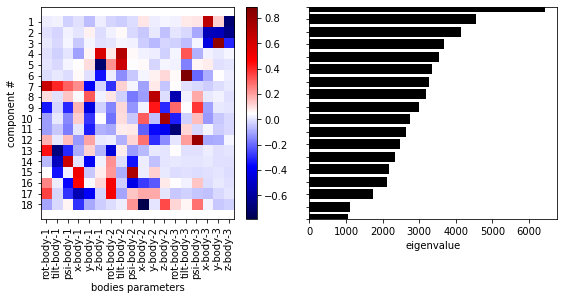

In [4]:
print('Load data [check out eigenvectors and eigenvalues]:')
ids,dims,U,L,Vt = cmp.load_pca(projection_file,eigenvector_file, as_is=False)

/home/fpoitevi/notebooks/cryo_home/slaclab/cryoEM-notebooks/src/dataviz.py:39: RuntimeWarning: divide by zero encountered in log10
  plt.contourf(np.log10(counts.transpose()), extent=[xbins[0],xbins[-1],ybins[0],ybins[-1]],cmap = plt.cm.Greys, levels=levels)


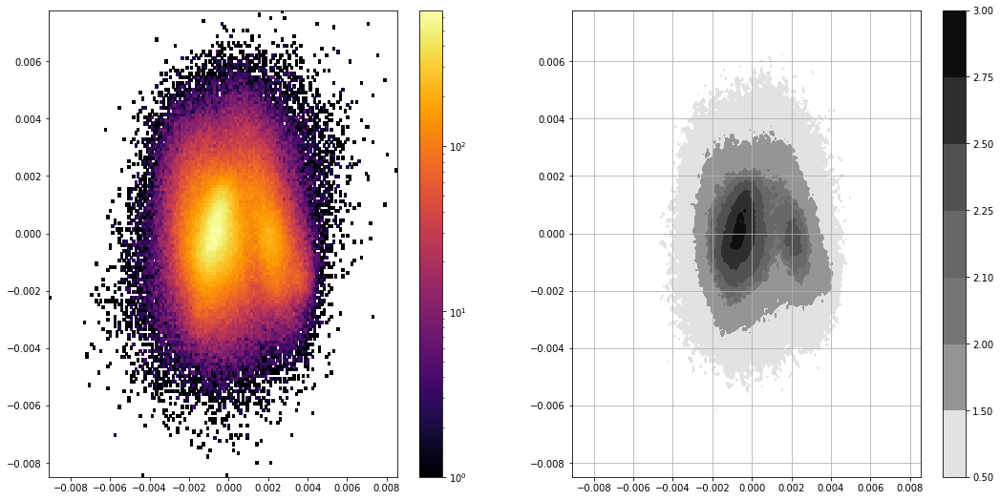

In [5]:
dataviz.biplot_histncontour(Vt[0,:],Vt[1,:], levels=[0.5,1.5,2,2.1,2.25,2.5,2.75,3])

Check particle coordinates in eigenspace:


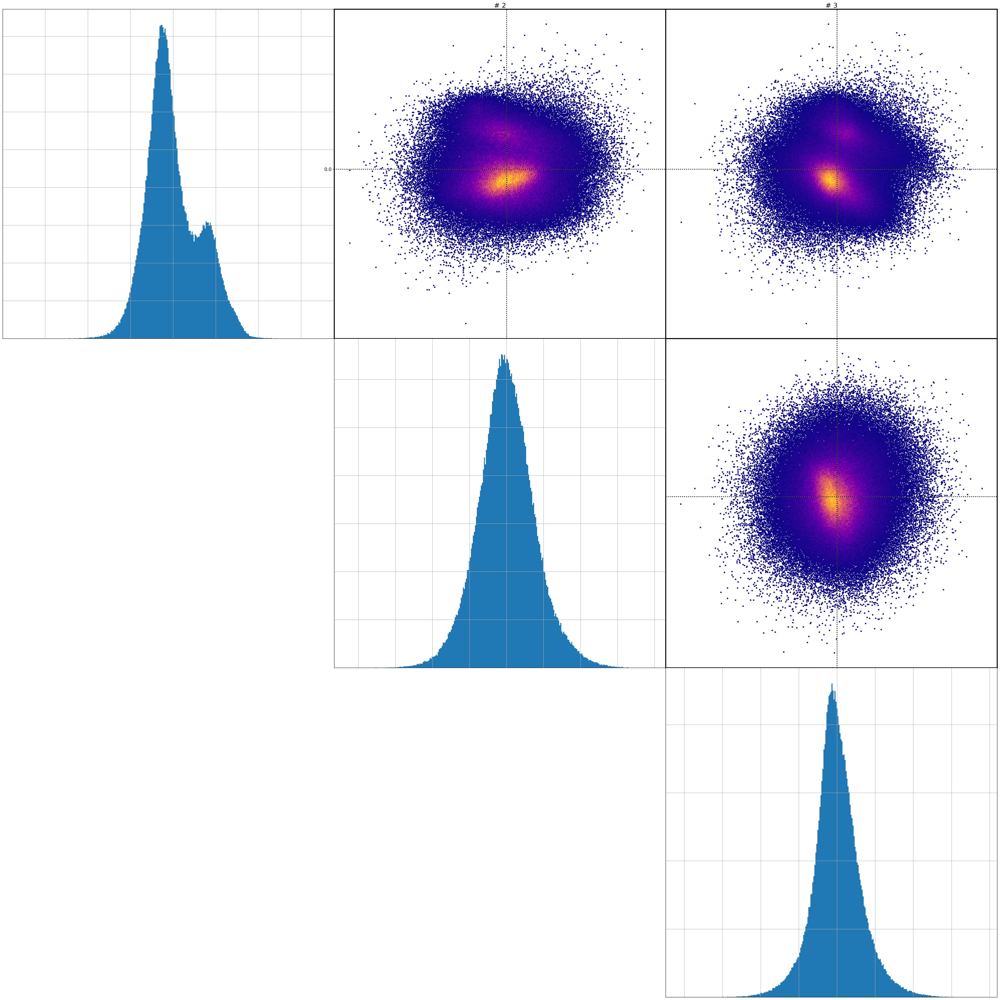

In [6]:
print('Check particle coordinates in eigenspace:')
nplot=3 #len(dims)
dataviz.biplots(Vt.T,n=nplot,nbins=300,figsize=6,show_histo=True)

## Approach 1: K-means clustering

In [7]:
from sklearn.cluster import KMeans
help(KMeans)

Help on class KMeans in module sklearn.cluster.k_means_:

class KMeans(sklearn.base.BaseEstimator, sklearn.base.ClusterMixin, sklearn.base.TransformerMixin)
 |  K-Means clustering
 |  
 |  Read more in the :ref:`User Guide <k_means>`.
 |  
 |  Parameters
 |  ----------
 |  
 |  n_clusters : int, optional, default: 8
 |      The number of clusters to form as well as the number of
 |      centroids to generate.
 |  
 |  init : {'k-means++', 'random' or an ndarray}
 |      Method for initialization, defaults to 'k-means++':
 |  
 |      'k-means++' : selects initial cluster centers for k-mean
 |      clustering in a smart way to speed up convergence. See section
 |      Notes in k_init for more details.
 |  
 |      'random': choose k observations (rows) at random from data for
 |      the initial centroids.
 |  
 |      If an ndarray is passed, it should be of shape (n_clusters, n_features)
 |      and gives the initial centers.
 |  
 |  n_init : int, default: 10
 |      Number of time t

In [8]:
ndim=3
nskip=100
data = np.dot(np.diag(L[0:ndim]), Vt[0:ndim,:]).T
data_reduced = data[::nskip,:] #np.dot(np.diag(L[0:ndim]), Vt[0:ndim,::nskip]).T

In [9]:
kmeans = KMeans(n_clusters=10, n_init=10).fit(data_reduced)

Check particle coordinates in eigenspace:


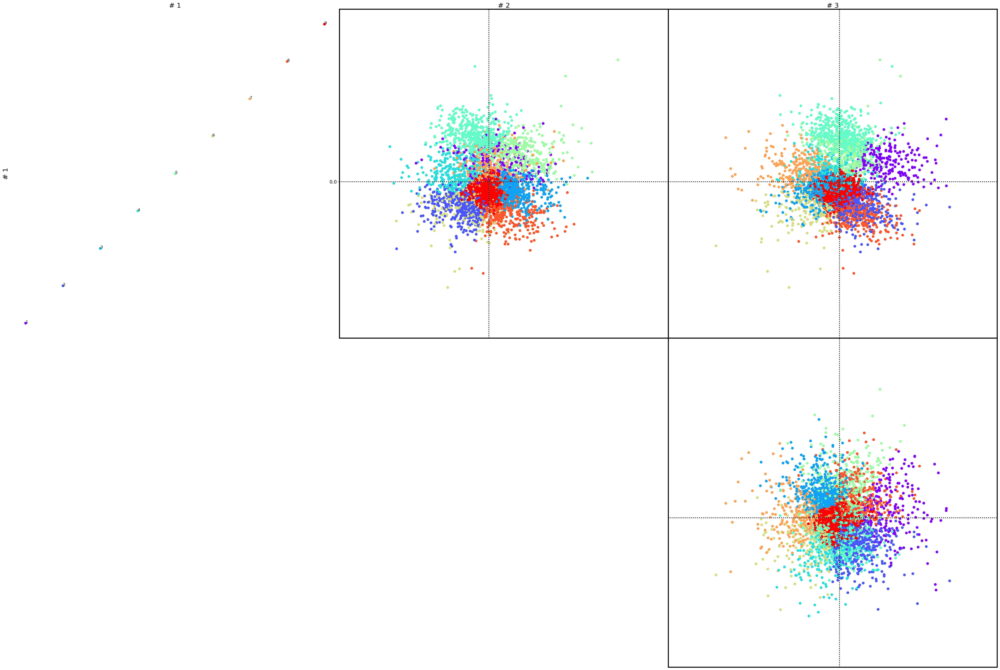

In [10]:
print('Check particle coordinates in eigenspace:')
nplot=3 #len(dims)
dataviz.biplots(Vt[0:ndim,::nskip].T,n=nplot,nbins=100,show_histo=False,figsize=6,c=kmeans.labels_)

In [11]:
assignment = kmeans.predict(np.dot(np.diag(L[0:ndim]), Vt[0:ndim,:]).T)

Check particle coordinates in eigenspace:


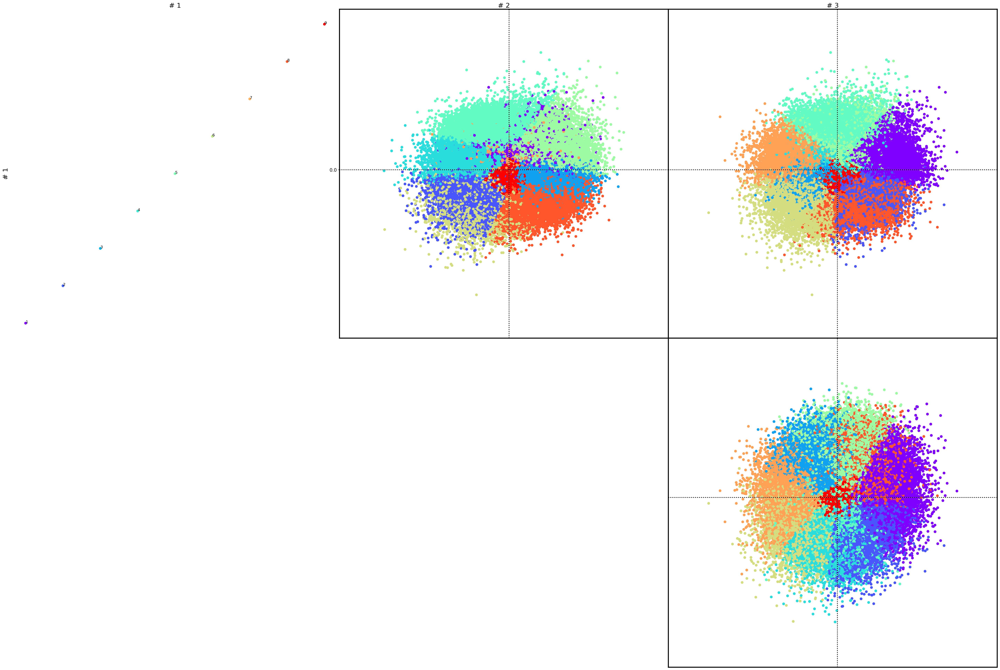

In [12]:
print('Check particle coordinates in eigenspace:')
nplot=3 #len(dims)
dataviz.biplots(Vt[0:ndim,:].T,n=nplot,nbins=100,show_histo=False,figsize=6,c=assignment)

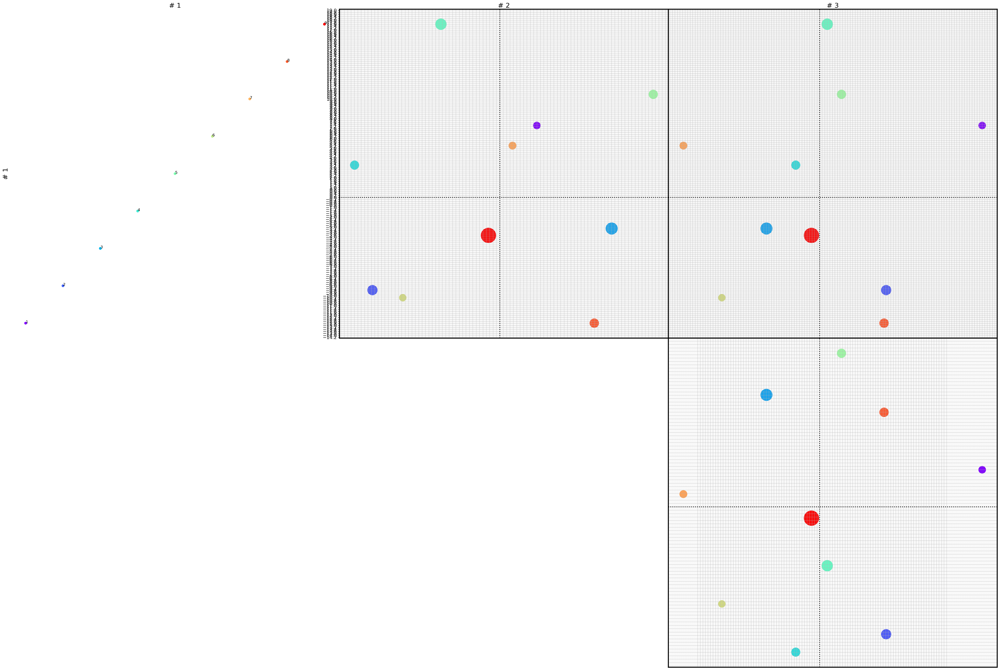

In [23]:
nplot=3 #len(dims)
unique, counts = np.unique(assignment, return_counts=True)
dataviz.biplots(kmeans.cluster_centers_,n=nplot,figsize=6,c=np.arange(10), scatter_size=L[0]*counts/np.sum(counts))

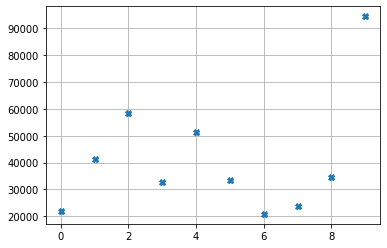

In [27]:
unique, counts = np.unique(assignment, return_counts=True)
#print(dict(zip(unique, counts)))
plt.plot(unique,counts, 'X')
plt.grid()
plt.show()

In [19]:
particles = get_centroid_particles(data, kmeans.cluster_centers_, projection_file, root_dir=PROJECT_DIR)

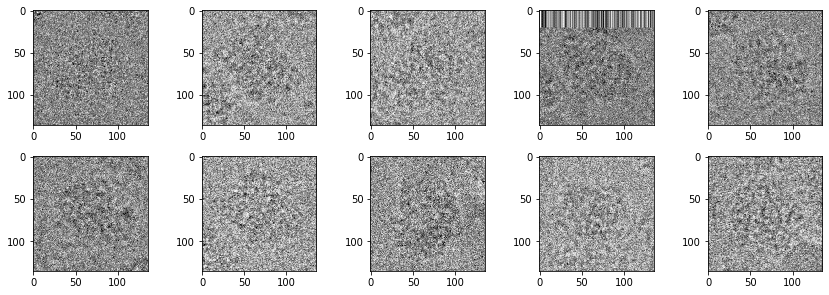

In [20]:
show_particles(particles, figsize=12, ncol=5)

In [24]:
cmp.save_cluster(ids,dims,U,L,Vt,c=assignment,keyword=ANALYSIS_DIR+'kmeans_10_dim3_of_init_gmm_dim18_n2')

In [26]:
glob.glob(ANALYSIS_DIR+'kmean*')

['/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_7_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_5_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_6_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_0_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_9_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmeans_10_dim3_of_init_gmm_dim18_n2_ei

Convert those `.dat` files to `.star` format so we can refine each

In [29]:
file_star = DATA_DIR+'run_data.star'
list_dat  = ('kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_0_projs.dat',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_1_projs.dat',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_2_projs.dat',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_3_projs.dat',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_4_projs.dat',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_5_projs.dat',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_6_projs.dat',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_7_projs.dat',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_8_projs.dat',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_9_projs.dat')
list_star = ('kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_0_projs.star',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_1_projs.star',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_2_projs.star',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_3_projs.star',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_4_projs.star',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_5_projs.star',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_6_projs.star',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_7_projs.star',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_8_projs.star',
             'kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_9_projs.star')

In [30]:
for dat, star in zip(list_dat, list_star):
    cmp.dat2star(file_star,ANALYSIS_DIR+dat,outfile=ANALYSIS_DIR+star)

Total number of particles =  461561
Total number of particles =  21987
Wrote particles to file  /gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_0_projs.star
Total number of particles =  461561
Total number of particles =  41366
Wrote particles to file  /gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_1_projs.star
Total number of particles =  461561
Total number of particles =  58407
Wrote particles to file  /gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmeans_10_dim3_of_init_gmm_dim18_n2_cluster_2_projs.star
Total number of particles =  461561
Total number of particles =  32617
Wrote particles to file  /gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/kmean

## Approach 2: Diffusion map

# Toolkit

In [17]:
def show_particles(particles, ncol=5, figsize=12):
    n_particles = particles.shape[0]
    n = int(n_particles/ncol)
    if(n>=ncol):
        figsize_row = int(figsize*n/ncol)
    else:
        figsize_row = int(figsize/n)
    fig = plt.figure(figsize=(figsize, figsize_row))
    for i in range( 0, n_particles ):
        fig.add_subplot( int(n_particles/ncol)+1, ncol, i+1 )
        plt.imshow( particles[i], cmap='Greys' )
    plt.tight_layout()
    plt.show()

def get_centroid_particles(data, centroids, projection_file, root_dir='/'):
    """
    """
    n_centroids = centroids.shape[0]
    pfile = np.genfromtxt(projection_file, dtype='str')
    iframe, mrcsfile = pfile[0,0].split('@')
    particle_test = get_particle_from_mrcfile(root_dir+mrcsfile, index=int(iframe))
    p_size_x, p_size_y = particle_test.shape
    particles = np.empty((n_centroids, p_size_x, p_size_y))
    for i_centroids in np.arange(n_centroids):
        idx = (np.linalg.norm(data - centroids[i_centroids,:], axis=1)).argmin()
        iframe, mrcsfile = pfile[idx,0].split('@')
        particles[i_centroids,...] = get_particle_from_mrcfile(root_dir+mrcsfile, index=int(iframe))
    return particles
        
def get_particle_from_mrcfile(mrc_file, index=None):
    """
    """
    with mrcfile.open(mrc_file, permissive=True) as mrc:
        particles = mrc.data
    if index is None:
        return particles
    else:
        return particles[index,...]